In [1]:
!pip install mtcnn
!pip install keras-facenet

     |████████████████████████████████| 2.3 MB 7.5 MB/s 
  Created wheel for keras-facenet: filename=keras_facenet-0.3.2-py3-none-any.whl size=10385 sha256=b7343136c320a995431ec735ec4e5d342062e9f58c2a5924a23e2385452b6bd3
  Stored in directory: /root/.cache/pip/wheels/2b/76/1a/a29ceb07bfca098e2b0bc8690d550753a0384cbed26d5f47ee
Successfully built keras-facenet


In [2]:
import numpy as np 
import pandas as pd 
import os
from keras_facenet import FaceNet

In [3]:
embedder = FaceNet()

In [5]:
from tensorflow import keras
model = keras.models.load_model('/content/data-huber.h5')

In [6]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 512)]        0           []                               
                                                                                                  
 dense_17 (Dense)               (None, 128)          65664       ['input_3[0][0]']                
                                                                                                  
 dense_28 (Dense)               (None, 128)          65664       ['input_3[0][0]']                
                                                                                                  
 dropout_3 (Dropout)            multiple             0           ['dense_17[0][0]',               
                                                                  'dense_18[0][0]',         

In [7]:
import mtcnn
import cv2
from google.colab.patches import cv2_imshow
detector = mtcnn.MTCNN()

In [8]:
!git clone https://github.com/davisking/dlib-models

Cloning into 'dlib-models'...
remote: Enumerating objects: 186, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 186 (delta 17), reused 11 (delta 1), pack-reused 154
Receiving objects: 100% (186/186), 408.51 MiB | 40.16 MiB/s, done.
Resolving deltas: 100% (89/89), done.


In [ ]:
!bzip2 -d '/content/dlib-models/shape_predictor_5_face_landmarks.dat.bz2'

In [9]:
!apt update
!apt install -y cmake
!pip install dlib

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [696 B]
Hit:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:5 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:6 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:7 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:8 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:9 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:10 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:13 http://ppa.launchpad.net/cran/libgit2/u

In [12]:
import cv2
import numpy as np
from PIL import Image
import dlib
from google.colab.patches import cv2_imshow


detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('dlib-models/shape_predictor_5_face_landmarks.dat')

def shape_to_normal(shape):
    shape_normal = []
    for i in range(0, 5):
        shape_normal.append((i, (shape.part(i).x, shape.part(i).y)))
    return shape_normal

def get_eyes_nose_dlib(shape):
    nose = shape[4][1]
    left_eye_x = int(shape[3][1][0] + shape[2][1][0]) // 2
    left_eye_y = int(shape[3][1][1] + shape[2][1][1]) // 2
    right_eyes_x = int(shape[1][1][0] + shape[0][1][0]) // 2
    right_eyes_y = int(shape[1][1][1] + shape[0][1][1]) // 2
    return nose, (left_eye_x, left_eye_y), (right_eyes_x, right_eyes_y)

def distance(a, b):
    return np.sqrt((a[0] - b[0]) ** 2 + (a[1] - b[1]) ** 2)

def cosine_formula(length_line1, length_line2, length_line3):
    cos_a = -(length_line3 ** 2 - length_line2 ** 2 - length_line1 ** 2) / (2 * length_line2 * length_line1)
    return cos_a

def rotate_point(origin, point, angle):
    ox, oy = origin
    px, py = point

    qx = ox + np.cos(angle) * (px - ox) - np.sin(angle) * (py - oy)
    qy = oy + np.sin(angle) * (px - ox) + np.cos(angle) * (py - oy)
    return qx, qy


def is_between(point1, point2, point3, extra_point):
    c1 = (point2[0] - point1[0]) * (extra_point[1] - point1[1]) - (point2[1] - point1[1]) * (extra_point[0] - point1[0])
    c2 = (point3[0] - point2[0]) * (extra_point[1] - point2[1]) - (point3[1] - point2[1]) * (extra_point[0] - point2[0])
    c3 = (point1[0] - point3[0]) * (extra_point[1] - point3[1]) - (point1[1] - point3[1]) * (extra_point[0] - point3[0])
    if (c1 < 0 and c2 < 0 and c3 < 0) or (c1 > 0 and c2 > 0 and c3 > 0):
        return True
    else:
        return False

def image_alignment(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    rects = detector(gray, 0)
    if len(rects) > 0:
        for rect in rects:
            x = rect.left()
            y = rect.top()
            w = rect.right()
            h = rect.bottom()
            shape = predictor(gray, rect)
        shape = shape_to_normal(shape)
        nose, left_eye, right_eye = get_eyes_nose_dlib(shape)
        center_of_forehead = ((left_eye[0] + right_eye[0]) // 2, (left_eye[1] + right_eye[1]) // 2)
        center_pred = (int((x + w) / 2), int((y + y) / 2))
        length_line1 = distance(center_of_forehead, nose)
        length_line2 = distance(center_pred, nose)
        length_line3 = distance(center_pred, center_of_forehead)
        cos_a = cosine_formula(length_line1, length_line2, length_line3)
        angle = np.arccos(cos_a)
        rotated_point = rotate_point(nose, center_of_forehead, angle)
        rotated_point = (int(rotated_point[0]), int(rotated_point[1]))
        if is_between(nose, center_of_forehead, center_pred, rotated_point):
            angle = np.degrees(-angle)
        else:
            angle = np.degrees(angle)
        img = Image.fromarray(img)
        img_aligned = np.array(img.rotate(angle))
        return img_aligned
    else: return img

RuntimeError: ignored

In [ ]:
import math
from mtcnn.mtcnn import MTCNN
import time
detector1 = MTCNN()

In [ ]:
def check (img):
  
  faces = detector1.detect_faces(img)
  for i in range(len(faces)):
    x, y, width, height = faces[i]['box']
    image = img[y:y+height,x:x+width,:]
    image = cv2.resize(image,dsize=(128,128))
    cv2_imshow(image)
    image = image_alignment(image)
    sample =  np.reshape(image, (1,image.shape[0], -1,3))
    sample = embedder.embeddings(sample)
    cv2_imshow(image)
    res = model.predict(sample)
    print(res)
    print("Age ", math.ceil(res[0]*116))
    if res[-1] > 0.5:
      gender = "Female"
    else:
      gender = "Male"
    print("Gender ", gender)

In [13]:
img = cv2.imread('/content/test_23.jpg')
check(img)

InvalidImage: ignored

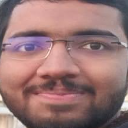

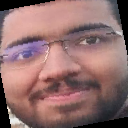

[array([[0.23194817]], dtype=float32), array([[1.5679846e-03, 5.3304791e-02, 7.0104992e-01, 2.2319812e-01,
        1.7837910e-02, 2.7195464e-03, 2.8245521e-04, 2.1252536e-05,
        7.5564922e-06, 8.3303785e-06, 1.9659608e-06, 9.1650769e-08]],
      dtype=float32), array([[0.04303664]], dtype=float32)]
Age  27
Gender  Male


In [ ]:
img = cv2.imread('/content/test_27.png')
check(img)

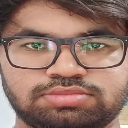

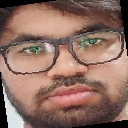

[array([[0.26569515]], dtype=float32), array([[2.7913091e-04, 4.7215777e-03, 3.6785325e-01, 5.0666010e-01,
        1.0716202e-01, 1.2475161e-02, 8.1621512e-04, 2.1705766e-05,
        7.4253603e-06, 1.2101943e-06, 2.1944072e-06, 1.5440451e-08]],
      dtype=float32), array([[0.04067084]], dtype=float32)]
Age  31
Gender  Male


In [ ]:
img = cv2.imread('/content/test_equal.png')
check(img)

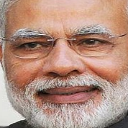

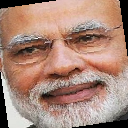

[array([[0.51956624]], dtype=float32), array([[4.5402867e-05, 1.5904820e-05, 3.1673207e-04, 4.9114334e-03,
        6.1019901e-02, 4.5763901e-01, 3.8107699e-01, 8.1351630e-02,
        1.3252045e-02, 1.4254576e-04, 2.0568268e-04, 2.2737042e-05]],
      dtype=float32), array([[0.06369352]], dtype=float32)]
Age  61
Gender  Male


In [ ]:
img = cv2.imread('/content/PM_Modi_2015.jpg')
check(img)

124
1
(360, 640, 3)


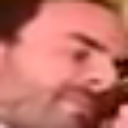

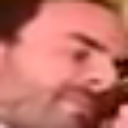

Age  29
Gender  Male


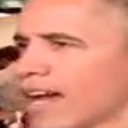

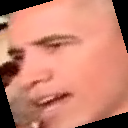

Age  44
Gender  Male


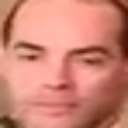

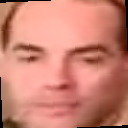

Age  33
Gender  Male


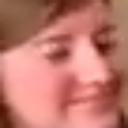

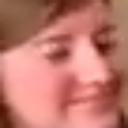

Age  36
Gender  Female
2
(360, 640, 3)


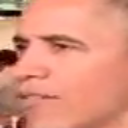

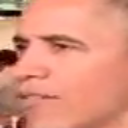

Age  47
Gender  Male


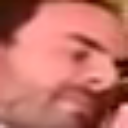

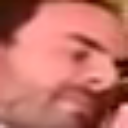

Age  28
Gender  Male


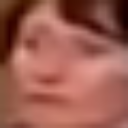

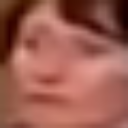

Age  31
Gender  Female


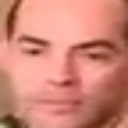

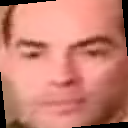

Age  33
Gender  Male


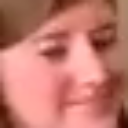

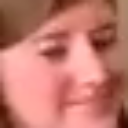

Age  24
Gender  Female
3
(360, 640, 3)


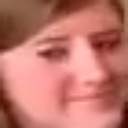

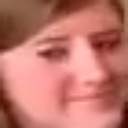

Age  23
Gender  Female


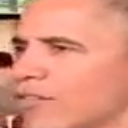

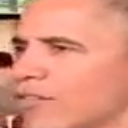

Age  48
Gender  Male


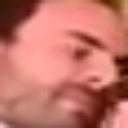

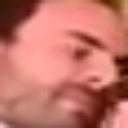

Age  27
Gender  Male


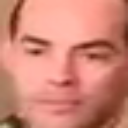

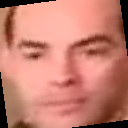

Age  31
Gender  Male


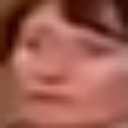

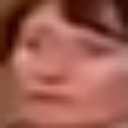

Age  30
Gender  Female
4
(360, 640, 3)


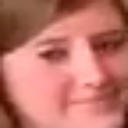

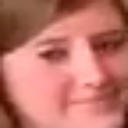

Age  24
Gender  Female


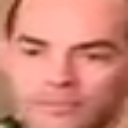

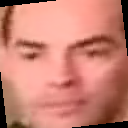

Age  30
Gender  Male


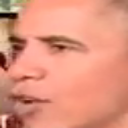

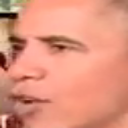

Age  45
Gender  Male


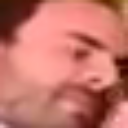

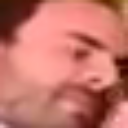

Age  26
Gender  Male


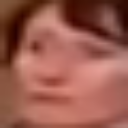

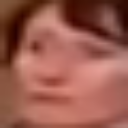

Age  32
Gender  Female
5
(360, 640, 3)


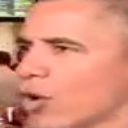

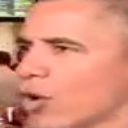

Age  31
Gender  Male


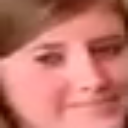

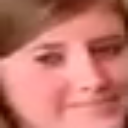

Age  22
Gender  Female


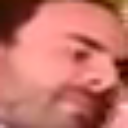

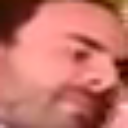

Age  28
Gender  Male


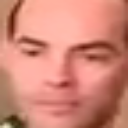

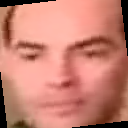

Age  29
Gender  Male


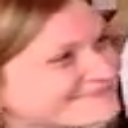

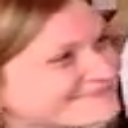

Age  27
Gender  Female


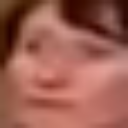

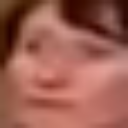

Age  30
Gender  Male
6
(360, 640, 3)


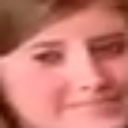

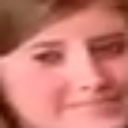

Age  23
Gender  Female


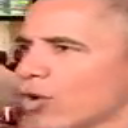

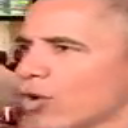

Age  31
Gender  Male


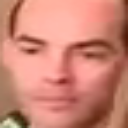

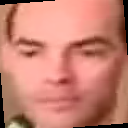

Age  30
Gender  Male


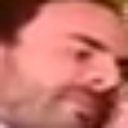

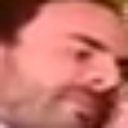

Age  30
Gender  Male


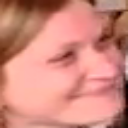

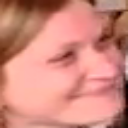

Age  31
Gender  Female


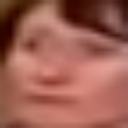

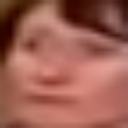

Age  31
Gender  Female


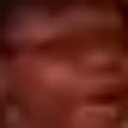

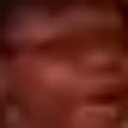

Age  28
Gender  Male
7
(360, 640, 3)


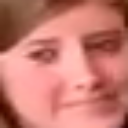

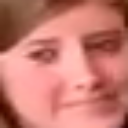

Age  20
Gender  Female


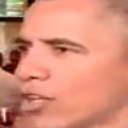

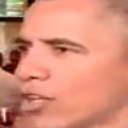

Age  34
Gender  Male


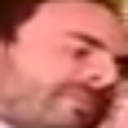

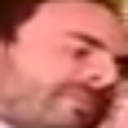

Age  27
Gender  Male


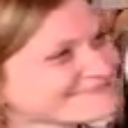

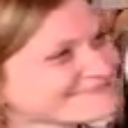

Age  31
Gender  Female


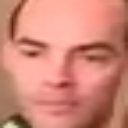

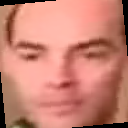

Age  28
Gender  Male


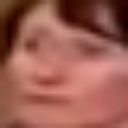

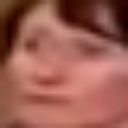

Age  32
Gender  Female


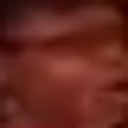

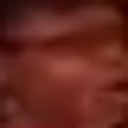

Age  28
Gender  Female
8
(360, 640, 3)


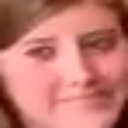

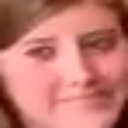

Age  23
Gender  Female


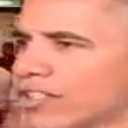

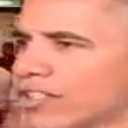

Age  34
Gender  Male


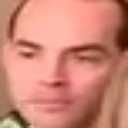

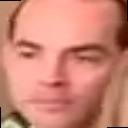

Age  31
Gender  Male


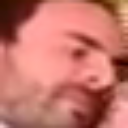

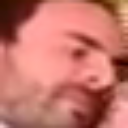

Age  29
Gender  Male


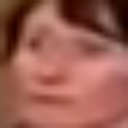

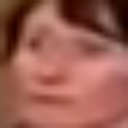

Age  32
Gender  Female


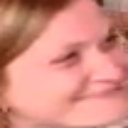

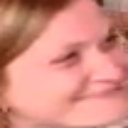

Age  30
Gender  Female
9
(360, 640, 3)


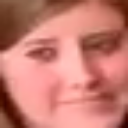

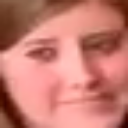

Age  24
Gender  Female


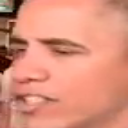

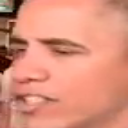

Age  30
Gender  Male


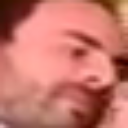

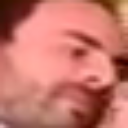

Age  31
Gender  Male


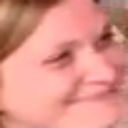

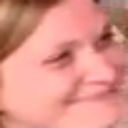

Age  28
Gender  Female


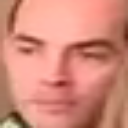

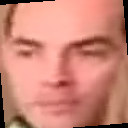

Age  31
Gender  Male


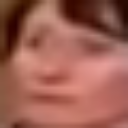

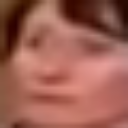

Age  36
Gender  Female
10
(360, 640, 3)


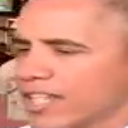

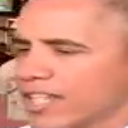

Age  26
Gender  Male


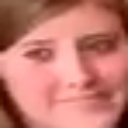

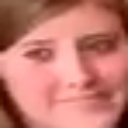

Age  25
Gender  Female


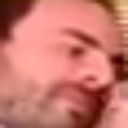

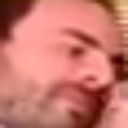

Age  29
Gender  Male


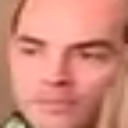

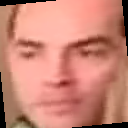

Age  31
Gender  Male


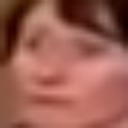

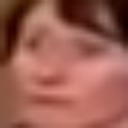

Age  30
Gender  Female


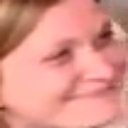

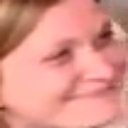

Age  34
Gender  Female
11
(360, 640, 3)


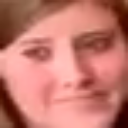

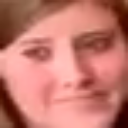

Age  27
Gender  Female


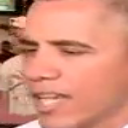

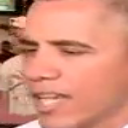

Age  25
Gender  Male


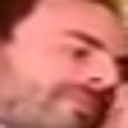

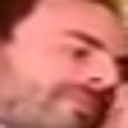

Age  30
Gender  Male


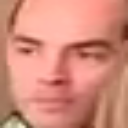

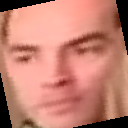

Age  30
Gender  Male


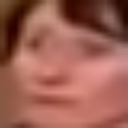

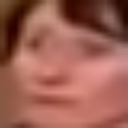

Age  29
Gender  Female


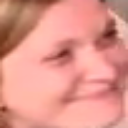

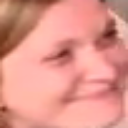

Age  31
Gender  Female
12
(360, 640, 3)


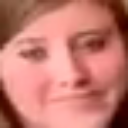

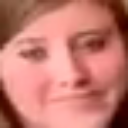

Age  24
Gender  Female


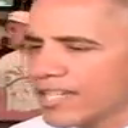

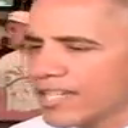

Age  26
Gender  Male


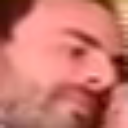

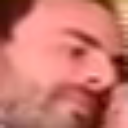

Age  29
Gender  Male


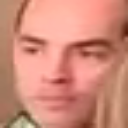

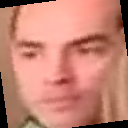

Age  30
Gender  Male


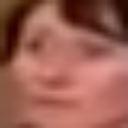

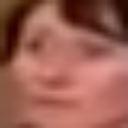

Age  28
Gender  Female


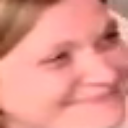

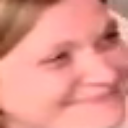

Age  36
Gender  Female
13
(360, 640, 3)


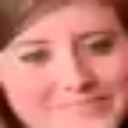

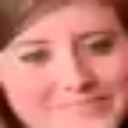

Age  26
Gender  Female


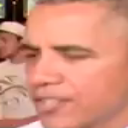

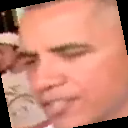

Age  27
Gender  Male


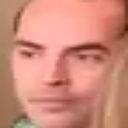

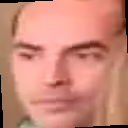

Age  33
Gender  Male


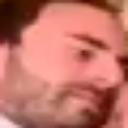

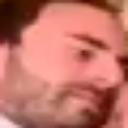

Age  33
Gender  Male


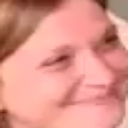

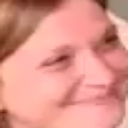

Age  39
Gender  Female
14
(360, 640, 3)


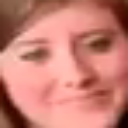

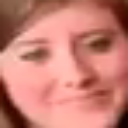

Age  26
Gender  Female


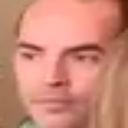

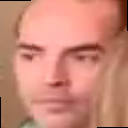

Age  33
Gender  Male


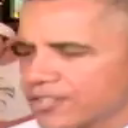

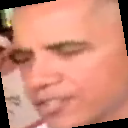

Age  26
Gender  Male


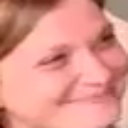

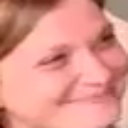

Age  37
Gender  Female
15
(360, 640, 3)


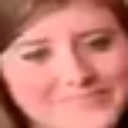

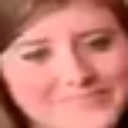

Age  27
Gender  Female


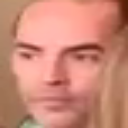

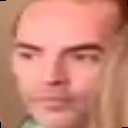

Age  31
Gender  Male


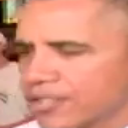

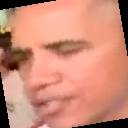

Age  34
Gender  Male


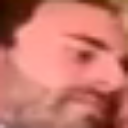

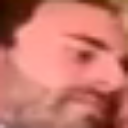

Age  30
Gender  Male
16
(360, 640, 3)


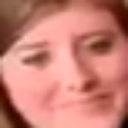

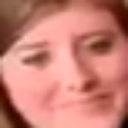

Age  27
Gender  Female


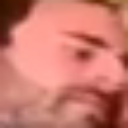

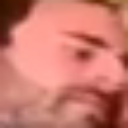

Age  28
Gender  Male


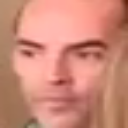

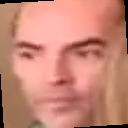

Age  32
Gender  Male


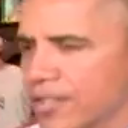

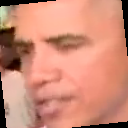

Age  40
Gender  Male


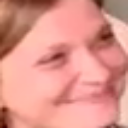

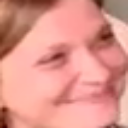

Age  31
Gender  Female
17
(360, 640, 3)


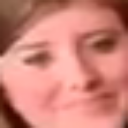

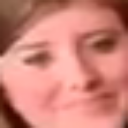

Age  25
Gender  Female


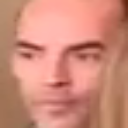

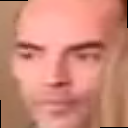

Age  36
Gender  Male


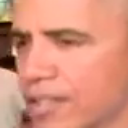

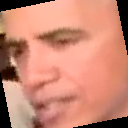

Age  43
Gender  Male


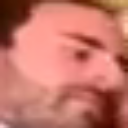

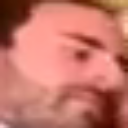

Age  29
Gender  Male


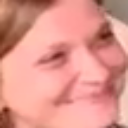

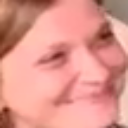

Age  33
Gender  Female
18
(360, 640, 3)


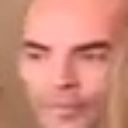

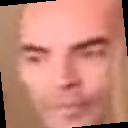

Age  31
Gender  Male


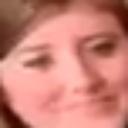

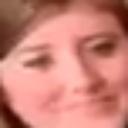

Age  33
Gender  Female


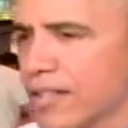

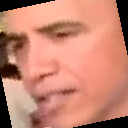

Age  43
Gender  Male


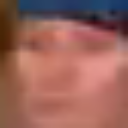

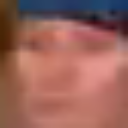

Age  17
Gender  Male


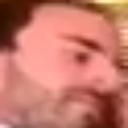

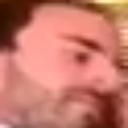

Age  29
Gender  Male


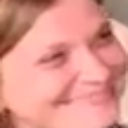

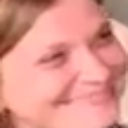

Age  33
Gender  Female
19
(360, 640, 3)


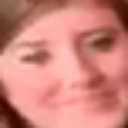

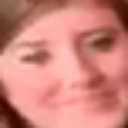

Age  32
Gender  Female


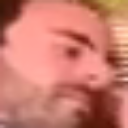

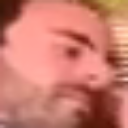

Age  32
Gender  Male


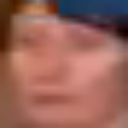

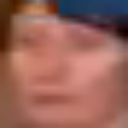

Age  27
Gender  Male


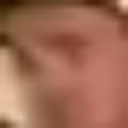

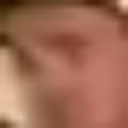

Age  36
Gender  Male


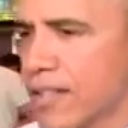

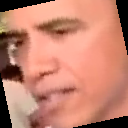

Age  45
Gender  Male


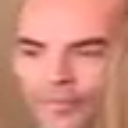

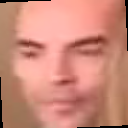

Age  31
Gender  Male


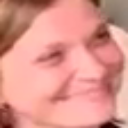

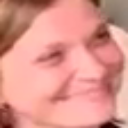

Age  35
Gender  Female
20
(360, 640, 3)


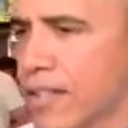

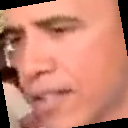

Age  47
Gender  Male


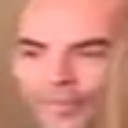

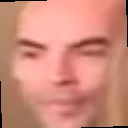

Age  31
Gender  Male


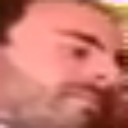

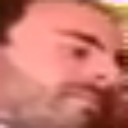

Age  25
Gender  Male


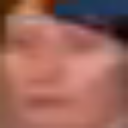

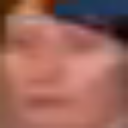

Age  22
Gender  Male


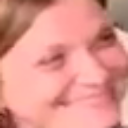

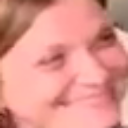

Age  34
Gender  Female


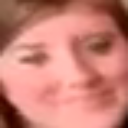

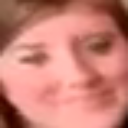

Age  30
Gender  Female
21
(360, 640, 3)


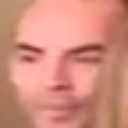

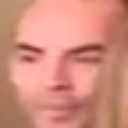

Age  31
Gender  Male


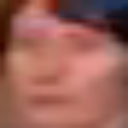

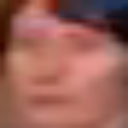

Age  27
Gender  Male


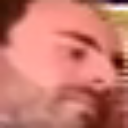

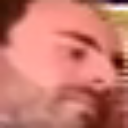

Age  27
Gender  Male


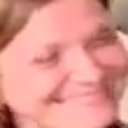

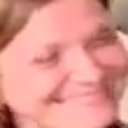

Age  35
Gender  Female


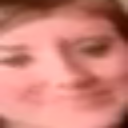

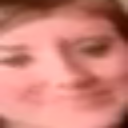

Age  29
Gender  Female
22
(360, 640, 3)


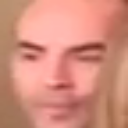

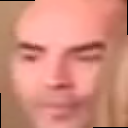

Age  31
Gender  Male


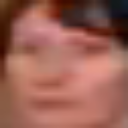

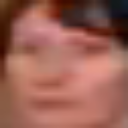

Age  27
Gender  Female


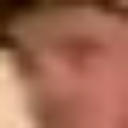

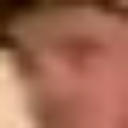

Age  37
Gender  Male


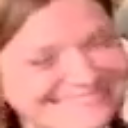

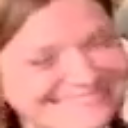

Age  33
Gender  Female
23
(360, 640, 3)


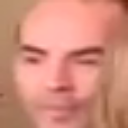

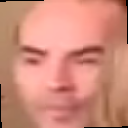

Age  31
Gender  Male


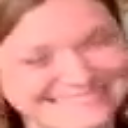

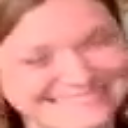

Age  37
Gender  Female


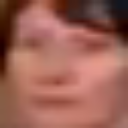

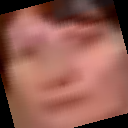

Age  23
Gender  Male


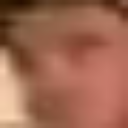

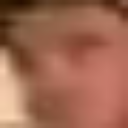

Age  27
Gender  Male
24
(360, 640, 3)


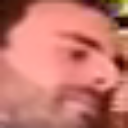

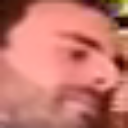

Age  29
Gender  Male


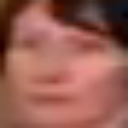

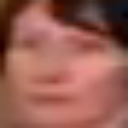

Age  36
Gender  Female


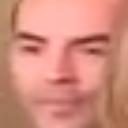

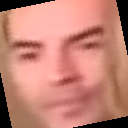

Age  29
Gender  Male


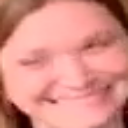

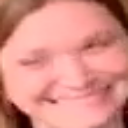

Age  10
Gender  Female
25
(360, 640, 3)


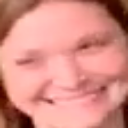

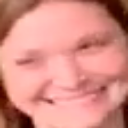

Age  16
Gender  Female


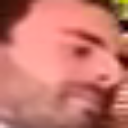

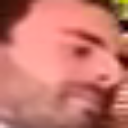

Age  28
Gender  Male


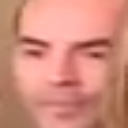

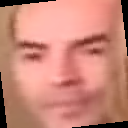

Age  31
Gender  Male


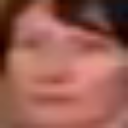

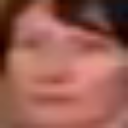

Age  42
Gender  Female


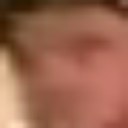

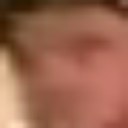

Age  30
Gender  Male
26
(360, 640, 3)


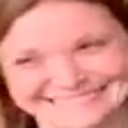

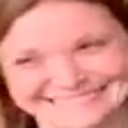

Age  14
Gender  Female


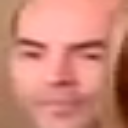

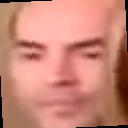

Age  28
Gender  Male


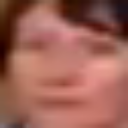

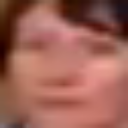

Age  19
Gender  Male


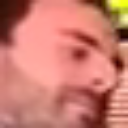

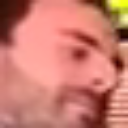

Age  30
Gender  Male
27
(360, 640, 3)


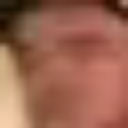

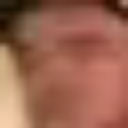

Age  47
Gender  Male


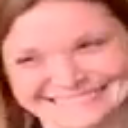

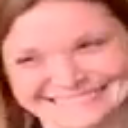

Age  10
Gender  Female


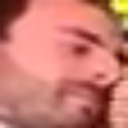

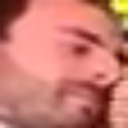

Age  29
Gender  Male


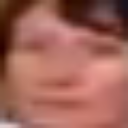

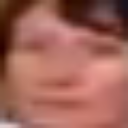

Age  22
Gender  Male


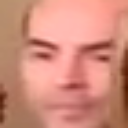

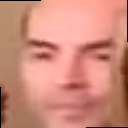

Age  29
Gender  Male
28
(360, 640, 3)


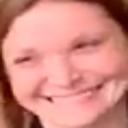

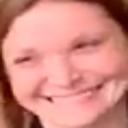

Age  12
Gender  Female


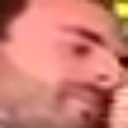

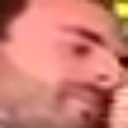

Age  28
Gender  Male


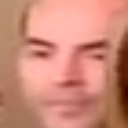

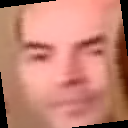

Age  34
Gender  Male


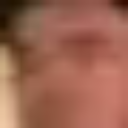

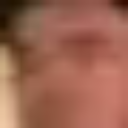

Age  48
Gender  Male
29
(360, 640, 3)


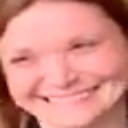

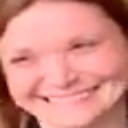

Age  14
Gender  Female


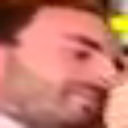

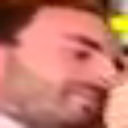

Age  31
Gender  Male


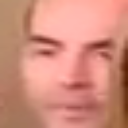

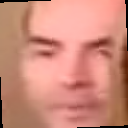

Age  29
Gender  Male


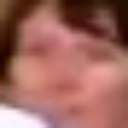

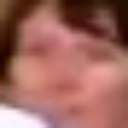

Age  4
Gender  Female


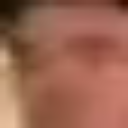

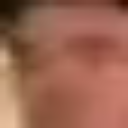

Age  41
Gender  Male
30
(360, 640, 3)


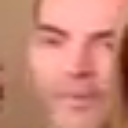

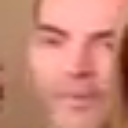

Age  29
Gender  Male


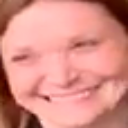

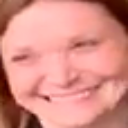

Age  17
Gender  Female


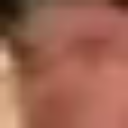

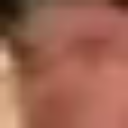

Age  20
Gender  Male
31
(360, 640, 3)


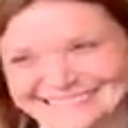

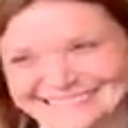

Age  24
Gender  Female


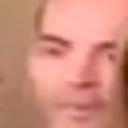

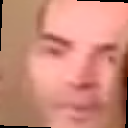

Age  28
Gender  Male


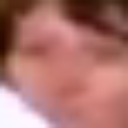

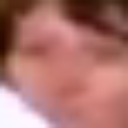

Age  20
Gender  Male


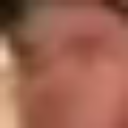

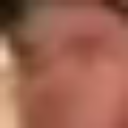

Age  24
Gender  Male
32
(360, 640, 3)


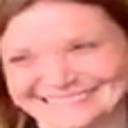

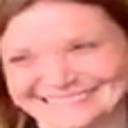

Age  24
Gender  Female


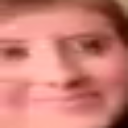

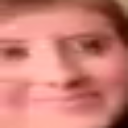

Age  30
Gender  Female


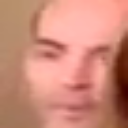

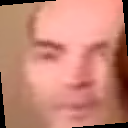

Age  29
Gender  Male


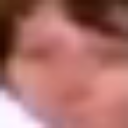

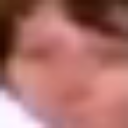

Age  18
Gender  Male
33
(360, 640, 3)


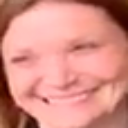

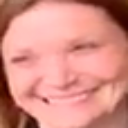

Age  39
Gender  Female


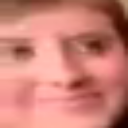

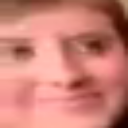

Age  26
Gender  Female


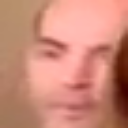

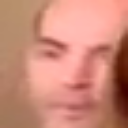

Age  27
Gender  Male


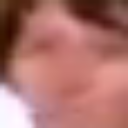

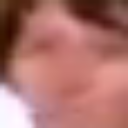

Age  16
Gender  Male


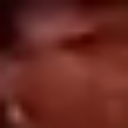

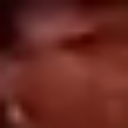

Age  18
Gender  Male
34
(360, 640, 3)


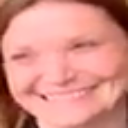

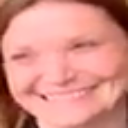

Age  33
Gender  Female


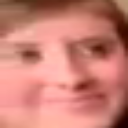

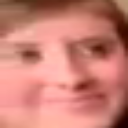

Age  28
Gender  Male


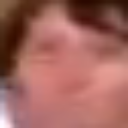

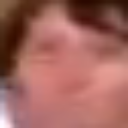

Age  27
Gender  Male
35
(360, 640, 3)


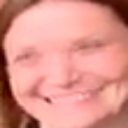

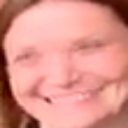

Age  44
Gender  Female


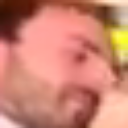

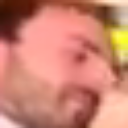

Age  31
Gender  Male


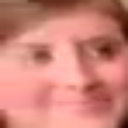

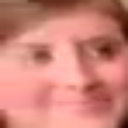

Age  32
Gender  Female
36
(360, 640, 3)


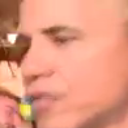

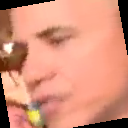

Age  31
Gender  Male


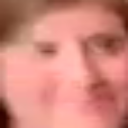

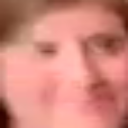

Age  50
Gender  Female
37
(360, 640, 3)


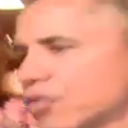

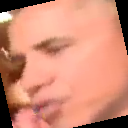

Age  29
Gender  Male


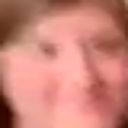

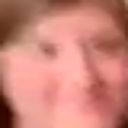

Age  33
Gender  Female
38
(360, 640, 3)


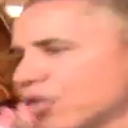

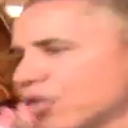

Age  32
Gender  Male


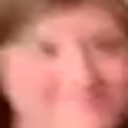

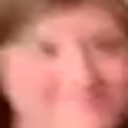

Age  37
Gender  Female
39
(360, 640, 3)


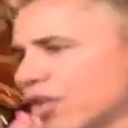

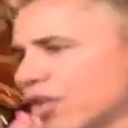

Age  33
Gender  Male


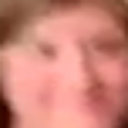

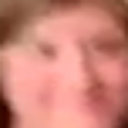

Age  36
Gender  Female
40
(360, 640, 3)


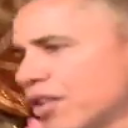

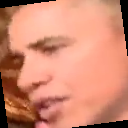

Age  33
Gender  Male


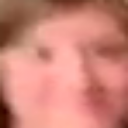

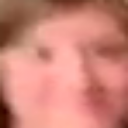

Age  30
Gender  Female
41
(360, 640, 3)


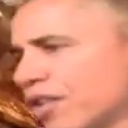

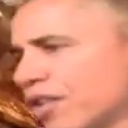

Age  38
Gender  Male


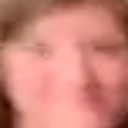

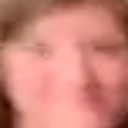

Age  36
Gender  Female
42
(360, 640, 3)


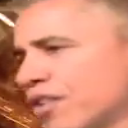

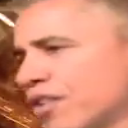

Age  42
Gender  Male


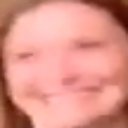

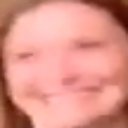

Age  35
Gender  Female


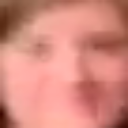

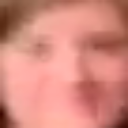

Age  12
Gender  Female
43
(360, 640, 3)


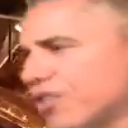

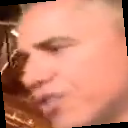

Age  30
Gender  Male


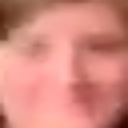

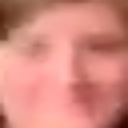

Age  22
Gender  Male
44
(360, 640, 3)


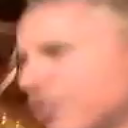

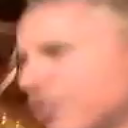

Age  23
Gender  Male
45
(360, 640, 3)


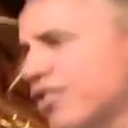

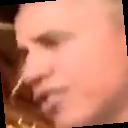

Age  35
Gender  Male
46
(360, 640, 3)


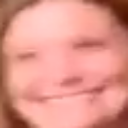

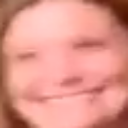

Age  28
Gender  Female


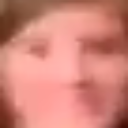

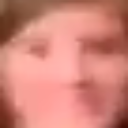

Age  17
Gender  Male
47
(360, 640, 3)


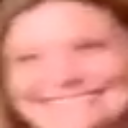

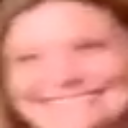

Age  18
Gender  Female


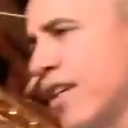

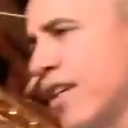

Age  32
Gender  Male


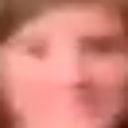

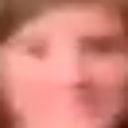

Age  20
Gender  Male
48
(360, 640, 3)


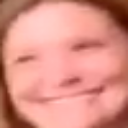

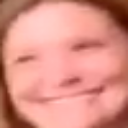

Age  13
Gender  Female


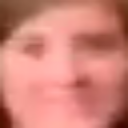

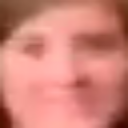

Age  22
Gender  Male
49
(360, 640, 3)


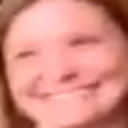

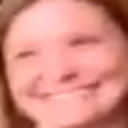

Age  7
Gender  Female


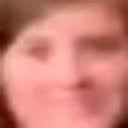

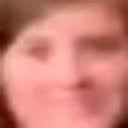

Age  40
Gender  Female
50
(360, 640, 3)


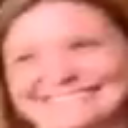

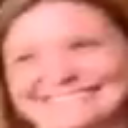

Age  23
Gender  Female


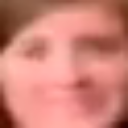

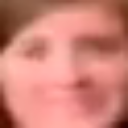

Age  42
Gender  Female
51
(360, 640, 3)


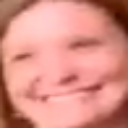

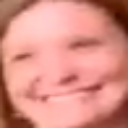

Age  10
Gender  Female


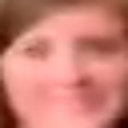

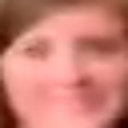

Age  44
Gender  Female
52
(360, 640, 3)


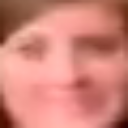

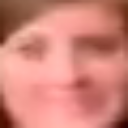

Age  32
Gender  Male


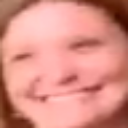

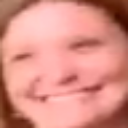

Age  16
Gender  Female
53
(360, 640, 3)


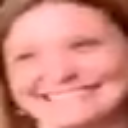

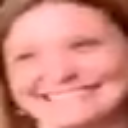

Age  19
Gender  Female


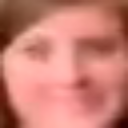

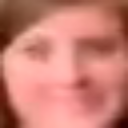

Age  33
Gender  Female
54
(360, 640, 3)


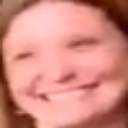

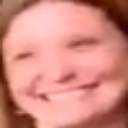

Age  26
Gender  Female


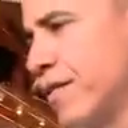

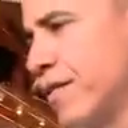

Age  29
Gender  Male


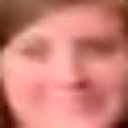

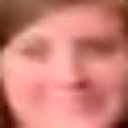

Age  34
Gender  Female
55
(360, 640, 3)


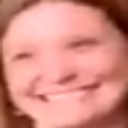

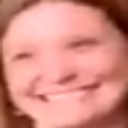

Age  22
Gender  Female


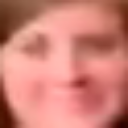

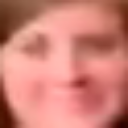

Age  35
Gender  Female


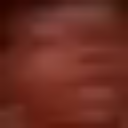

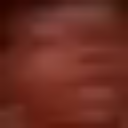

Age  22
Gender  Male
56
(360, 640, 3)


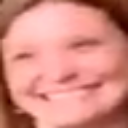

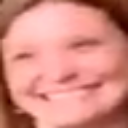

Age  16
Gender  Female


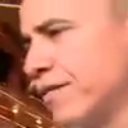

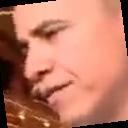

Age  29
Gender  Male


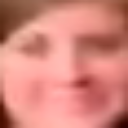

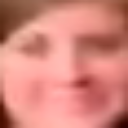

Age  33
Gender  Female


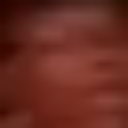

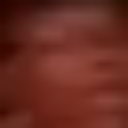

Age  13
Gender  Male
57
(360, 640, 3)


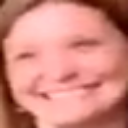

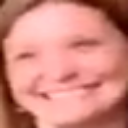

Age  26
Gender  Female


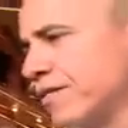

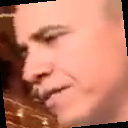

Age  39
Gender  Male


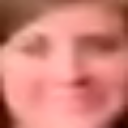

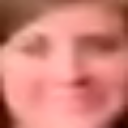

Age  42
Gender  Female
58
(360, 640, 3)


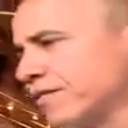

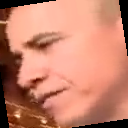

Age  33
Gender  Male


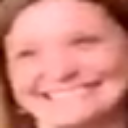

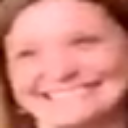

Age  20
Gender  Female


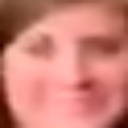

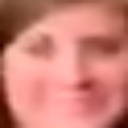

Age  33
Gender  Female
59
(360, 640, 3)


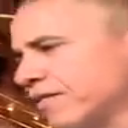

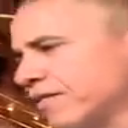

Age  31
Gender  Male


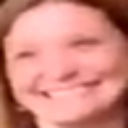

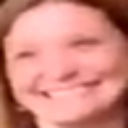

Age  17
Gender  Female


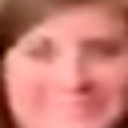

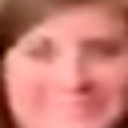

Age  37
Gender  Female
60
(360, 640, 3)


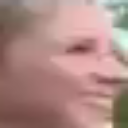

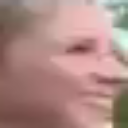

Age  29
Gender  Female


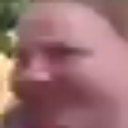

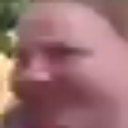

Age  10
Gender  Female


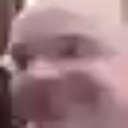

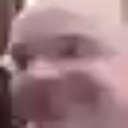

Age  22
Gender  Male
61
(360, 640, 3)


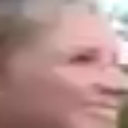

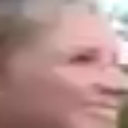

Age  14
Gender  Female


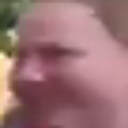

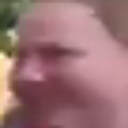

Age  7
Gender  Female


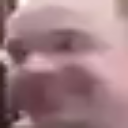

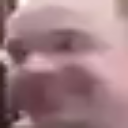

Age  18
Gender  Male
62
(360, 640, 3)


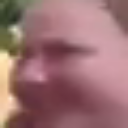

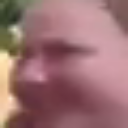

Age  25
Gender  Male


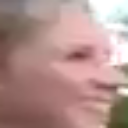

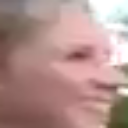

Age  62
Gender  Female


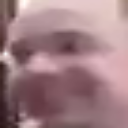

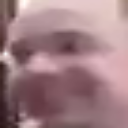

Age  7
Gender  Male
63
(360, 640, 3)


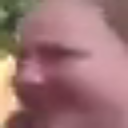

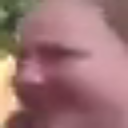

Age  8
Gender  Female


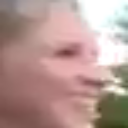

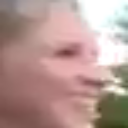

Age  54
Gender  Female


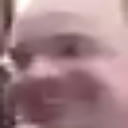

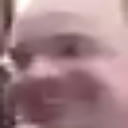

Age  12
Gender  Male
64
(360, 640, 3)


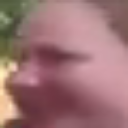

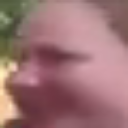

Age  20
Gender  Female


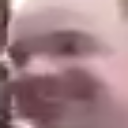

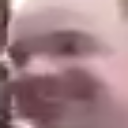

Age  19
Gender  Male


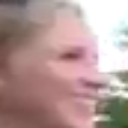

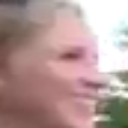

Age  35
Gender  Female
65
(360, 640, 3)


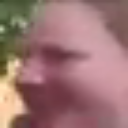

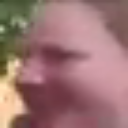

Age  9
Gender  Female


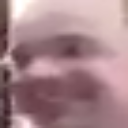

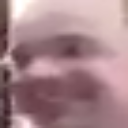

Age  18
Gender  Male


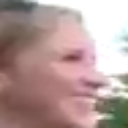

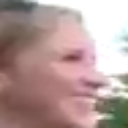

Age  29
Gender  Female
66
(360, 640, 3)


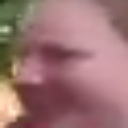

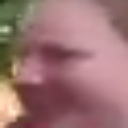

Age  2
Gender  Male


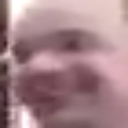

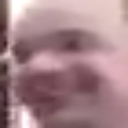

Age  39
Gender  Male
67
(360, 640, 3)


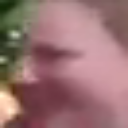

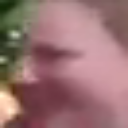

Age  33
Gender  Female


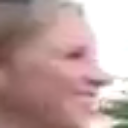

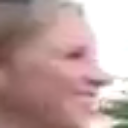

Age  50
Gender  Female


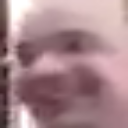

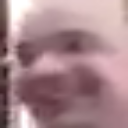

Age  22
Gender  Female
68
(360, 640, 3)


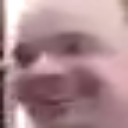

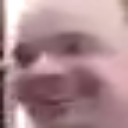

Age  39
Gender  Male


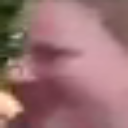

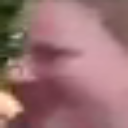

Age  33
Gender  Female


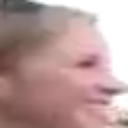

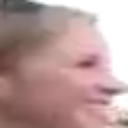

Age  41
Gender  Female
69
(360, 640, 3)


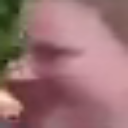

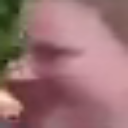

Age  21
Gender  Female


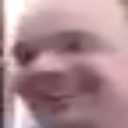

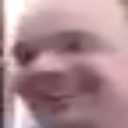

Age  36
Gender  Male


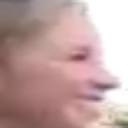

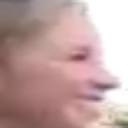

Age  65
Gender  Female
70
(360, 640, 3)


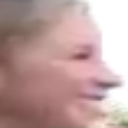

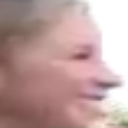

Age  28
Gender  Female


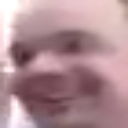

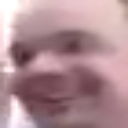

Age  40
Gender  Male


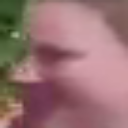

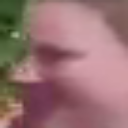

Age  18
Gender  Female


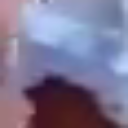

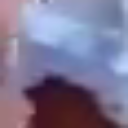

Age  60
Gender  Male
71
(360, 640, 3)


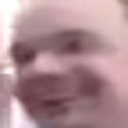

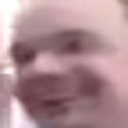

Age  28
Gender  Male


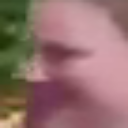

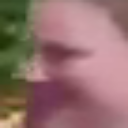

Age  11
Gender  Female


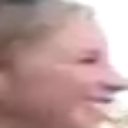

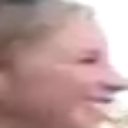

Age  47
Gender  Female
72
(360, 640, 3)


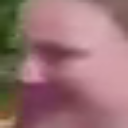

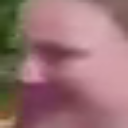

Age  36
Gender  Female


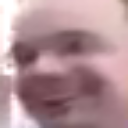

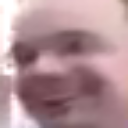

Age  18
Gender  Male


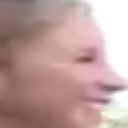

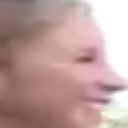

Age  52
Gender  Female
73
(360, 640, 3)


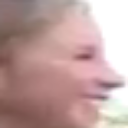

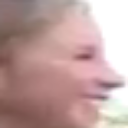

Age  45
Gender  Female


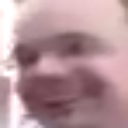

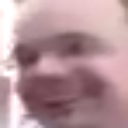

Age  28
Gender  Male


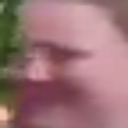

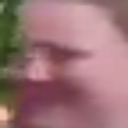

Age  19
Gender  Female
74
(360, 640, 3)


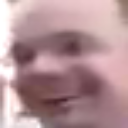

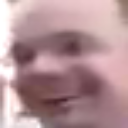

Age  20
Gender  Male


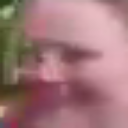

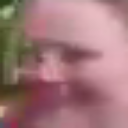

Age  16
Gender  Male


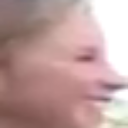

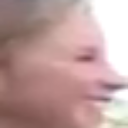

Age  46
Gender  Female
75
(360, 640, 3)


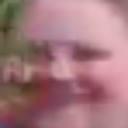

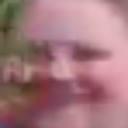

Age  20
Gender  Female


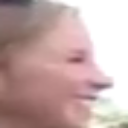

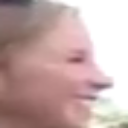

Age  49
Gender  Female


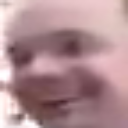

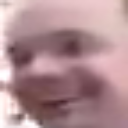

Age  28
Gender  Male
76
(360, 640, 3)


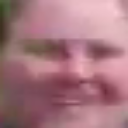

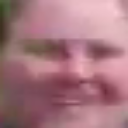

Age  22
Gender  Female


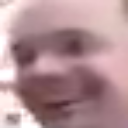

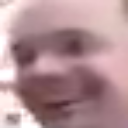

Age  28
Gender  Male


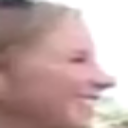

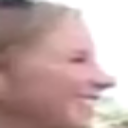

Age  46
Gender  Female


In [ ]:
cap = cv2.VideoCapture('/content/trimmed_video.mp4')

if (cap.isOpened()== False): 
  print("Error opening video  file")

count = 0
length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print( length )

while(cap.isOpened()):

  ret, img = cap.read()
  if ret == True:
    
    count = count + 1
    print(count)
    check(img)
  
  else: 
    break